<a href="https://colab.research.google.com/github/airctic/icevision/blob/master/notebooks/getting_started_instance_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started with Instance Segmentation using IceVision

## Introduction

This tutorial walk you through the different steps of training the fridge dataset. the IceVision Framework is an **agnostic framework**. As an illustration, we will train our model using both the [fastai](https://github.com/fastai/fastai) library, and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning) libraries.

For more information about how the fridge dataset as well as its corresponding parser check out the [pennfudan folder](https://github.com/airctic/icedata/tree/master/icedata/datasets/pennfudan) in icedata.

## Installing IceVision and IceData
If on Colab run the following cell, else check the [installation instructions](https://airctic.com/dev/install/)

In [ ]:
# IceVision - IceData - MMDetection - YOLO v5 Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11

In [ ]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

## Imports

In [1]:
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/dnth/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Model
To create a model, we need to:

* Choose one of the **models** supported by IceVision
* Choose one of the **backbones** corresponding to a chosen model
* Determine the **number of the object classes**: This will be done after parsing a dataset. Check out the Parsing Section 

## Choose a model and backbone

We use **MMDet** here. When you want to use the torch vision version the COCOMetric will not be correct at the moment due to a problem in the bounding box conversion.

In [2]:
# model_type = models.mmdet.mask_rcnn
# backbone = model_type.backbones.resnet50_fpn_1x()

model_type = models.mmdet.swin
backbone = model_type.backbones.mask_rcnn_swin_t_p4_w7_fpn_1x_coco

## Datasets : Pennfudan
Fridge Objects dataset is tiny dataset that contains 134 images of 4 classes:
- can, 
- carton, 
- milk bottle, 
- water bottle.

IceVision provides very handy methods such as loading a dataset, parsing annotations, and more. 

In [3]:
# Loading Data
data_dir = icedata.pennfudan.load_data()
parser = icedata.pennfudan.parser(data_dir)

In [4]:
# train_ds, valid_ds = icedata.pennfudan.dataset(data_dir)
train_rs, valid_rs = parser.parse()

  0%|          | 0/170 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/170 [00:00<?, ?it/s]

In [5]:
# Transforms
image_size = 512
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=1024), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [6]:
train_ds = Dataset(train_rs, train_tfms)
valid_ds = Dataset(valid_rs, valid_tfms)

### Displaying the same image with different transforms

Note:
> Transforms are applied **lazily**, meaning they are only applied when we grab (get) an item.
> This means that, if you have augmentation (random) transforms, each time you get the **same** item from 
> the dataset you will get a slightly different version of it.

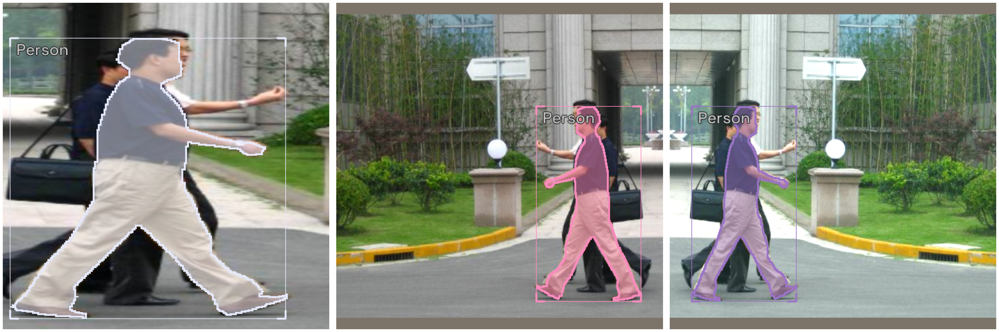

In [7]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

## DataLoader

In [8]:
# DataLoaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=4, shuffle=False)

In [9]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8, shuffle=False)

In [10]:
valid_batch = first(valid_dl)
infer_batch = first(infer_dl)

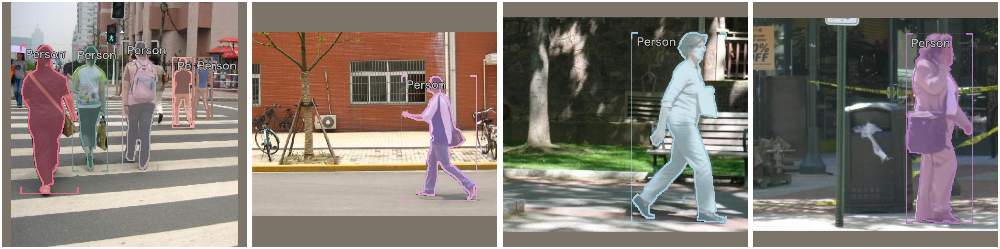

In [11]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

## Model

Now that we determined the number of classes (`num_classes`), we can create our `model` object.

In [12]:
# TODO: Better flow for train_ds
model = model_type.model(backbone=backbone(pretrained=True), num_classes=icedata.pennfudan.NUM_CLASSES) 

/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  warnings.warn(
2022-01-19 14:47:28,225 - mmdet - INFO - load checkpoint from http path: https://download.openmmlab.com/mmclassification/v0/swin-transformer/swin_tiny_224_b16x64_300e_imagenet_20210616_090925-66df6be6.pth
2022-01-19 14:47:28,330 - mmdet - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-01-19 14:47:28,345 - mmdet - INFO - initialize RPNHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01}
2022-01-19 14:47:28,349 - mmdet - INFO - initialize Shared2FCBBoxHead with init_cfg [{'type': 'Normal', 'std': 0.01, 'override': {'name': 'fc_cls'}}, {'type': 'Normal', 'std': 0.001, 'override': {'name': 'fc_reg'}}, {'type': 'Xavier', 'layer': 'Linear', 'override': [{'name': 'shared_fcs'}, {'name': 'cls_fcs'

2022-01-19 14:47:28,493 - mmcv - INFO - 
backbone.stages.1.blocks.0.norm2.bias - torch.Size([192]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,493 - mmcv - INFO - 
backbone.stages.1.blocks.0.ffn.layers.0.0.weight - torch.Size([768, 192]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,493 - mmcv - INFO - 
backbone.stages.1.blocks.0.ffn.layers.0.0.bias - torch.Size([768]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,493 - mmcv - INFO - 
backbone.stages.1.blocks.0.ffn.layers.1.weight - torch.Size([192, 768]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,494 - mmcv - INFO - 
backbone.stages.1.blocks.0.ffn.layers.1.bias - torch.Size([192]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,494 - mmcv - INFO - 
backbone.stages.1.blocks.1.norm1.weight - torch.Size([192]): 
Initialized by u

2022-01-19 14:47:28,507 - mmcv - INFO - 
backbone.stages.2.blocks.2.norm1.weight - torch.Size([384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,508 - mmcv - INFO - 
backbone.stages.2.blocks.2.norm1.bias - torch.Size([384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,508 - mmcv - INFO - 
backbone.stages.2.blocks.2.attn.w_msa.relative_position_bias_table - torch.Size([169, 12]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,508 - mmcv - INFO - 
backbone.stages.2.blocks.2.attn.w_msa.qkv.weight - torch.Size([1152, 384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,508 - mmcv - INFO - 
backbone.stages.2.blocks.2.attn.w_msa.qkv.bias - torch.Size([1152]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,509 - mmcv - INFO - 
backbone.stages.2.blocks.2.attn.w_msa.proj.weight - torch.Size

2022-01-19 14:47:28,518 - mmcv - INFO - 
backbone.stages.2.blocks.5.norm2.bias - torch.Size([384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,518 - mmcv - INFO - 
backbone.stages.2.blocks.5.ffn.layers.0.0.weight - torch.Size([1536, 384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,519 - mmcv - INFO - 
backbone.stages.2.blocks.5.ffn.layers.0.0.bias - torch.Size([1536]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,519 - mmcv - INFO - 
backbone.stages.2.blocks.5.ffn.layers.1.weight - torch.Size([384, 1536]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,519 - mmcv - INFO - 
backbone.stages.2.blocks.5.ffn.layers.1.bias - torch.Size([384]): 
Initialized by user-defined `init_weights` in SwinTransformer  
 
2022-01-19 14:47:28,519 - mmcv - INFO - 
backbone.stages.2.downsample.norm.weight - torch.Size([1536]): 
Initialized

2022-01-19 14:47:28,531 - mmcv - INFO - 
neck.lateral_convs.3.conv.weight - torch.Size([256, 768, 1, 1]): 
XavierInit: gain=1, distribution=uniform, bias=0 
 
2022-01-19 14:47:28,531 - mmcv - INFO - 
neck.lateral_convs.3.conv.bias - torch.Size([256]): 
The value is the same before and after calling `init_weights` of MaskRCNN  
 
2022-01-19 14:47:28,532 - mmcv - INFO - 
neck.fpn_convs.0.conv.weight - torch.Size([256, 256, 3, 3]): 
XavierInit: gain=1, distribution=uniform, bias=0 
 
2022-01-19 14:47:28,532 - mmcv - INFO - 
neck.fpn_convs.0.conv.bias - torch.Size([256]): 
The value is the same before and after calling `init_weights` of MaskRCNN  
 
2022-01-19 14:47:28,532 - mmcv - INFO - 
neck.fpn_convs.1.conv.weight - torch.Size([256, 256, 3, 3]): 
XavierInit: gain=1, distribution=uniform, bias=0 
 
2022-01-19 14:47:28,532 - mmcv - INFO - 
neck.fpn_convs.1.conv.bias - torch.Size([256]): 
The value is the same before and after calling `init_weights` of MaskRCNN  
 
2022-01-19 14:47:28,532

load checkpoint from local path: checkpoints/swin/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([4]).
size mismatch for roi_head.mask_head.conv_logits.weight: copying a param with shape torch.Size([80, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size(

## Metrics

In [13]:
metrics = [COCOMetric(metric_type=COCOMetricType.mask)]

## Training

IceVision is an agnostic framework meaning it can be plugged to other DL framework such as [fastai2](https://github.com/fastai/fastai2), and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning).  

You could also plug to oth DL framework using your own custom code.

### Training using fastai

In [14]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


SuggestedLRs(valley=0.00010964782268274575)

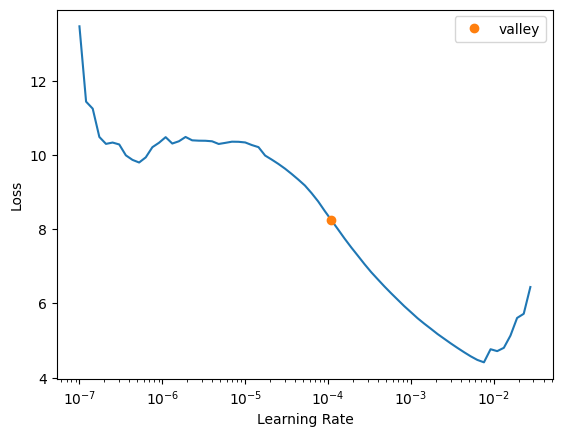

In [15]:
learn.lr_find()

In [16]:
learn.fine_tune(5, 3e-4, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,3.480314,0.545350,0.551773,00:12
1,1.469440,0.352339,0.672526,00:11


epoch,train_loss,valid_loss,COCOMetric,time
0,0.395314,0.340673,0.689593,00:12
1,0.372548,0.307593,0.704485,00:12
2,0.357918,0.299420,0.703804,00:12
3,0.334997,0.295773,0.727994,00:11
4,0.330220,0.284818,0.731378,00:11


### Training using Lightning

In [17]:
class LightModel(model_type.lightning.ModelAdapter):
    def configure_optimizers(self):
        return Adam(self.parameters(), lr=5e-4)
    
light_model = LightModel(model, metrics=metrics)

In [ ]:
trainer = pl.Trainer(max_epochs=5, gpus=1)
trainer.fit(light_model, train_dl, valid_dl)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type     | Params
-----------------------------------
0 | model | MaskRCNN | 47.4 M
-----------------------------------
47.4 M    Trainable params
0         Non-trainable params
47.4 M    Total params
189.478   Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/pytorch_lightning/utilities/data.py:59: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(
/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:428: UserWarning: The number of training samples (34) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/home/dnth/anaconda3/envs/icevision-contrib/lib/python3.8/site-packages/pytorch_lightning/utilities/data.py:59: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 2. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

## Show Results

In [ ]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

## Inference

### Predicting a batch of images

Instead of predicting a whole list of images at one, we can process small batches at the time: This option is more memory efficient. 


> NOTE: For a more detailed look at inference check out the [inference tutorial](https://airctic.com/dev/inference/)

In [ ]:
batch, records = first(valid_dl)

In [ ]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

In [ ]:
show_preds(preds=preds[:4], ncols=3)

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).